# Practica 3 de Mineria de datos - Equipo X
Caso de negocio: Segmentación de Clientes para Optimización de Ventas

Se recomienda ver el archivo en el siguiente google colab: https://colab.research.google.com/drive/1QFucYUXjr-qZanUS7aSpCa_XgOsY7DM6?usp=sharing

## Librerias a usar

In [1]:
# Manejo de la informacion
import pandas as pd
import numpy as np

# Graficacion
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from geopy.geocoders import Nominatim

# Aplicacion de modelos

from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import silhouette_score

## Obtencion de datos y eliminacion de columnas

In [2]:
#@title Importando datos
df = pd.read_csv('/content/Transacciones_de_ventas Practicas.csv', sep=',', encoding='latin-1')
print("Tamaño:",df.shape)
df.head()

Tamaño: (58903, 32)


,Sector,Tipo,Linea,Sublinea,Presentacion,Gramaje,Empresa,Año,Fecha,Cliente,...,No._Hijos,Antiguedad,Edad,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Funcion,Grupo
0,BEBIDAS,TIPO OAX,DIVERSOS,ISOTONICAS,INDIVIDUAL,0.6,957936 ALFA TORRE,2014,17-01-14,149580 ANDRES G,...,0,11,35,30 - 39,Sin asignar,Soltero,Nuevo Leon,Masculino,PROFESIONISTA,EJECUTIVOS
1,BEBIDAS,TIPO OAX,DIVERSOS,ISOTONICAS,INDIVIDUAL,0.6,957936 ALFA TORRE,2014,17-01-14,149580 ANDRES G,...,0,11,35,30 - 39,Sin asignar,Soltero,Nuevo Leon,Masculino,PROFESIONISTA,EJECUTIVOS
2,BEBIDAS,TIPO OAX,DIVERSOS,ISOTONICAS,INDIVIDUAL,0.6,957936 ALFA TORRE,2014,17-01-14,149580 ANDRES G,...,0,11,35,30 - 39,Sin asignar,Soltero,Nuevo Leon,Masculino,PROFESIONISTA,EJECUTIVOS
3,BEBIDAS,TIPO OAX,DIVERSOS,ISOTONICAS,INDIVIDUAL,0.6,957936 ALFA TORRE,2014,17-01-14,149580 ANDRES G,...,0,11,35,30 - 39,Sin asignar,Soltero,Nuevo Leon,Masculino,PROFESIONISTA,EJECUTIVOS
4,BEBIDAS,TIPO OAX,DIVERSOS,ISOTONICAS,INDIVIDUAL,0.6,957936 ALFA TORRE,2014,22-01-14,100861 MARIA DE,...,0,15,41,40 - 49,Sin asignar,Soltero,Nuevo Leon,Femenino,EMPLEADO A,EMPLEADOS


In [3]:
#@title Descripcion de los datos numericos
df.describe()

,Gramaje,Año,Transaccion,Pedido,Control,Producto,Cantidad,Precio,Precio_Max,Dif_PrecioMax,Importe,Clave_Cliente,No._Hijos,Antiguedad,Edad
count,58903.000000,58903.000000,58903.000000,58903.000000,5.890300e+04,5.890300e+04,58903.000000,58903.000000,58903.000000,58903.000000,58903.000000,58903.000000,58903.000000,58903.000000,58903.000000
mean,0.422715,2015.094715,566993.296182,95670.198224,1.815129e+06,1.815129e+06,1.687656,40.852449,47.909220,7.056769,63.332720,159770.425140,0.471266,8.516663,37.206271
std,0.523643,0.810848,13311.308168,13436.469024,1.111146e+07,1.111146e+07,2.181921,141.596259,154.455908,43.412498,373.341029,33553.013866,0.982056,5.822291,7.681939
min,0.030000,2014.000000,542421.000000,70855.000000,1.200000e+01,1.200000e+01,1.000000,2.200000,2.500000,0.000000,2.400000,100167.000000,0.000000,0.000000,23.000000
25%,0.200000,2014.000000,555513.000000,84080.000000,8.050000e+02,8.050000e+02,1.000000,15.500000,17.500000,0.000000,20.000000,128760.000000,0.000000,5.000000,31.000000
50%,0.300000,2015.000000,567352.000000,96128.000000,7.446000e+03,7.446000e+03,1.000000,28.000000,31.000000,1.300000,33.000000,160551.000000,0.000000,7.000000,37.000000
75%,0.450000,2016.000000,579254.000000,108005.000000,9.008000e+03,9.008000e+03,2.000000,38.000000,42.500000,4.000000,48.000000,187280.000000,0.000000,11.000000,42.000000
max,15.800000,2016.000000,588519.000000,117442.000000,7.009002e+07,7.009002e+07,165.000000,6000.000000,6000.000000,800.000000,38500.000000,230503.000000,8.000000,38.000000,63.000000


In [4]:
#@title Conteo de datos faltantes
faltantes = df.isna().sum()
print("No hay datos faltantes" if faltantes[faltantes < 0].sum() <= 0 else "Faltan datos")

No hay datos faltantes


In [5]:
#@title Quitando datos que no nos benefician
# Cliente contiene el id del cliente y su nombre, no todo esta bien formateado
# Control y Descripcion me quedo con Producto
# Transaccion me quedo con Pedido
# Precio, Precio_Max y Dif_PrecioMax no creo que ayuden me quedo con Importe
# Año se puede conseguir de la Fecha
# Sector, Sublinea, Tipo son redundantes me quedo con Linea
# Edad es redundante me quedo con Edad_Rango
# Empresa dato no relevante
# Presentacion dato no relevante
# Funcion es reduntante me quedo con grupo
# Unidad no existen muchos casos con Kg
# Gramaje y Cantidad esta bastante asociado

df = df.drop(axis=0, columns=['Cliente', 'Transaccion', 'Descripcion', 'Control',
                              "Precio", "Precio_Max", "Dif_PrecioMax", "Año", "Cantidad",
                              "Sector", "Sublinea", "Tipo", "Edad", "Empresa", "Gramaje", "Presentacion", "Funcion", "Unidad"])

In [6]:
#@title Todo el texto se pasara a mayusculas por si tienen errores ejemplo
cat_cols = df.select_dtypes(exclude=[np.number])
df[cat_cols.columns] = cat_cols.apply(lambda x: x.str.upper())
df.head()

,Linea,Fecha,Pedido,Producto,Importe,Clave_Cliente,No._Hijos,Antiguedad,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Grupo
0,DIVERSOS,17-01-14,71509,7186,11.0,149580,0,11,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,MASCULINO,EJECUTIVOS
1,DIVERSOS,17-01-14,71509,7187,11.0,149580,0,11,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,MASCULINO,EJECUTIVOS
2,DIVERSOS,17-01-14,71509,7185,11.0,149580,0,11,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,MASCULINO,EJECUTIVOS
3,DIVERSOS,17-01-14,71509,7184,11.0,149580,0,11,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,MASCULINO,EJECUTIVOS
4,DIVERSOS,22-01-14,71692,7184,22.0,100861,0,15,40 - 49,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS


In [7]:
#@title Obteniendo solo datos de los clientes
columnas_cliente = ["Clave_Cliente","No._Hijos", "Antiguedad", "Edad_Rango", "Escolaridad",
                    "Estado_Civil", "Estado", "Sexo", "Grupo"]

df_clientes = df[columnas_cliente].groupby("Clave_Cliente").agg('first').reset_index()
print("Clientes", df_clientes.Clave_Cliente.value_counts().sum())
df_clientes.head()

Clientes 524


,Clave_Cliente,No._Hijos,Antiguedad,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Grupo
0,100167,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS
1,100263,0,15,40 - 49,INGENIERIA,SOLTERO,NUEVO LEON,MASCULINO,EMPLEADOS
2,100363,2,15,30 - 39,SIN ASIGNAR,CASADO,NUEVO LEON,MASCULINO,EMPLEADOS
3,100491,0,15,50 - 59,SIN ASIGNAR,SOLTERO,SAN LUIS POTOSI,FEMENINO,EMPLEADOS
4,100861,0,15,40 - 49,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS


In [8]:
#@title Obteniendo solo datos de las ventas
df_ventas = df[df.columns.difference(columnas_cliente[1:])]
df_ventas.drop(columns='Clave_Cliente').head()

,Fecha,Importe,Linea,Pedido,Producto
0,17-01-14,11.0,DIVERSOS,71509,7186
1,17-01-14,11.0,DIVERSOS,71509,7187
2,17-01-14,11.0,DIVERSOS,71509,7185
3,17-01-14,11.0,DIVERSOS,71509,7184
4,22-01-14,22.0,DIVERSOS,71692,7184


In [9]:
#@title Quiero el mes y año, calulandolo de columna Fecha
df_ventas.loc[:, 'Fecha'] = pd.to_datetime(df['Fecha'], format='%d-%m-%y').dt.strftime('%m-%Y')
df_ventas.drop(columns=["Clave_Cliente"]).head()

,Fecha,Importe,Linea,Pedido,Producto
0,01-2014,11.0,DIVERSOS,71509,7186
1,01-2014,11.0,DIVERSOS,71509,7187
2,01-2014,11.0,DIVERSOS,71509,7185
3,01-2014,11.0,DIVERSOS,71509,7184
4,01-2014,22.0,DIVERSOS,71692,7184


In [10]:
#@title Agrupando los pedidos

print("Ventas antes de englobarlas:", df_ventas.shape)
df_ventas = df_ventas.groupby(by=["Clave_Cliente","Pedido", "Producto", "Linea", "Fecha"]).aggregate({
    "Importe": "sum",
}).reset_index()

print("Ventas despues de englobarlas:", df_ventas.shape)
df_ventas.head()

Ventas antes de englobarlas: (58903, 6)
Ventas despues de englobarlas: (58829, 6)


,Clave_Cliente,Pedido,Producto,Linea,Fecha,Importe
0,100167,71086,474,JAMONES,01-2014,45.8
1,100167,71086,7428,Q-MADURADOS,01-2014,43.8
2,100167,71086,7473,Q-FRESCOS,01-2014,30.3
3,100167,71966,30,JAMONES,01-2014,33.8
4,100167,71966,489,JAMONES,01-2014,30.9


In [11]:
#@title Dataframe mejorado

df = df_clientes.merge(df_ventas, on="Clave_Cliente", how="inner")
df = df.drop(columns=["Clave_Cliente", "Pedido", "Producto"])
df.head()

,No._Hijos,Antiguedad,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Grupo,Linea,Fecha,Importe
0,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014,45.8
1,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,Q-MADURADOS,01-2014,43.8
2,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,Q-FRESCOS,01-2014,30.3
3,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014,33.8
4,0,15,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014,30.9


In [12]:
#@title Obtencion de datos por tipo

numericos = df.select_dtypes(include=(np.number))
categoricos = df.select_dtypes(exclude=(np.number))

## Analisis de columnas categoricas

In [13]:
#@title Datos categoricos
categoricos.head()

,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Grupo,Linea,Fecha
0,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014
1,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,Q-MADURADOS,01-2014
2,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,Q-FRESCOS,01-2014
3,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014
4,30 - 39,SIN ASIGNAR,SOLTERO,NUEVO LEON,FEMENINO,EMPLEADOS,JAMONES,01-2014


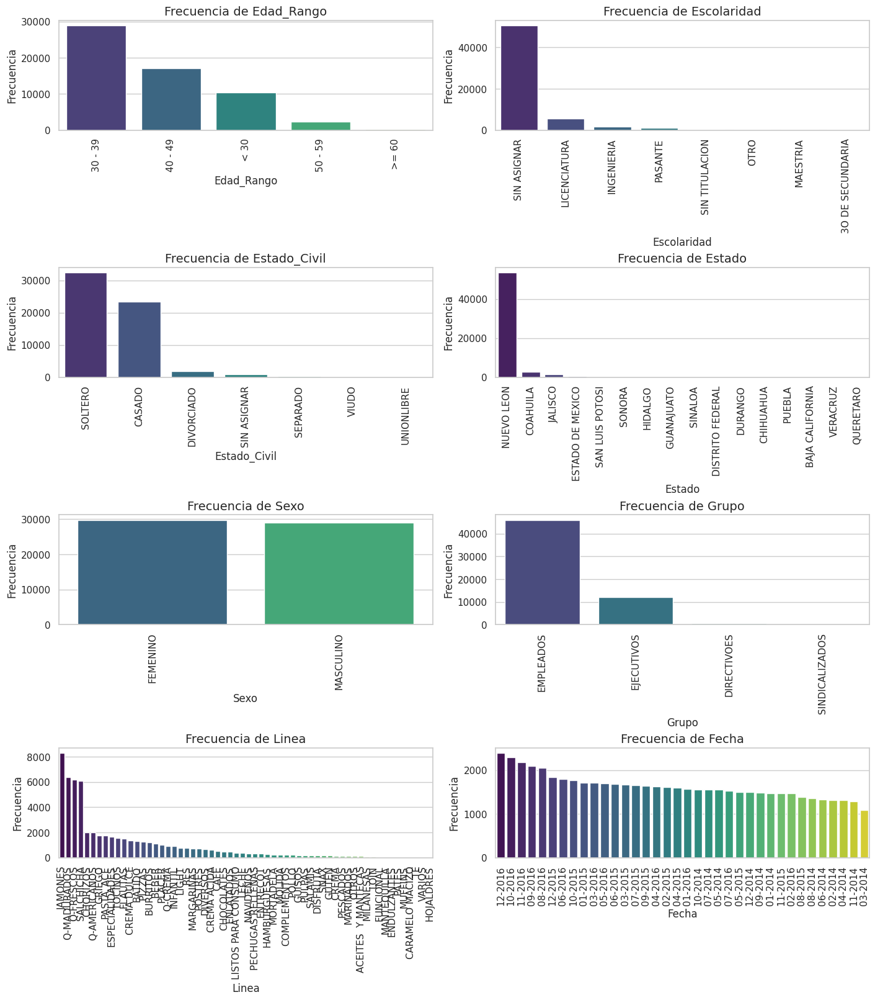

In [14]:
#@title Graficas de barras
# Configuración del estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y los ejes para subplots
num_cols = len(categoricos.columns)
num_rows = int(np.ceil(num_cols / 2))

fig, axes = plt.subplots(num_rows, 2, figsize=(14, 4 * num_rows), constrained_layout=True)

# Convertir axes a una lista para facilitar el acceso
axes = axes.flatten()

# Graficar cada columna en un subplot
for i, col in enumerate(categoricos.columns):
    counts = categoricos[col].value_counts().reset_index()
    counts.columns = [col, 'Frecuencia']

    unique_values = counts[col].nunique()
    palette = sns.color_palette('viridis', n_colors=unique_values)

    sns.barplot(data=counts, x=col, y='Frecuencia', ax=axes[i], hue=col, palette=palette, legend=False)
    axes[i].set_title(f'Frecuencia de {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Frecuencia', fontsize=12)
    axes[i].tick_params(axis='x', rotation=90)

# Eliminar ejes vacíos si hay menos de 2 por fila
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

In [15]:
#@title Grafico 3D de ventas, la linea y la edad

# Contar la frecuencia de combinaciones
frecuencias = categoricos.groupby(['Linea', 'Edad_Rango']).size().reset_index(name='Ventas')

# Preparar los datos para el gráfico
x = frecuencias['Linea']
y = frecuencias['Edad_Rango']
z = frecuencias['Ventas']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=z,
        colorscale='Viridis',
        colorbar=dict(title='Ventas')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Edad Rango',
        zaxis_title='Ventas',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Ventas en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [16]:
#@title Grafico 3D de ventas, la linea y la sexo

# Contar la frecuencia de combinaciones
frecuencias = categoricos.groupby(['Linea', 'Sexo']).size().reset_index(name='Ventas')

# Preparar los datos para el gráfico
x = frecuencias['Linea']
y = frecuencias['Sexo']
z = frecuencias['Ventas']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=z,
        colorscale='Viridis',
        colorbar=dict(title='Ventas')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Sexo',
        zaxis_title='Ventas',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Ventas en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [17]:
#@title Grafico 3D de ventas, la linea y Estado civil

# Contar la frecuencia de combinaciones
frecuencias = categoricos.groupby(['Linea', 'Estado_Civil']).size().reset_index(name='Ventas')

# Preparar los datos para el gráfico
x = frecuencias['Linea']
y = frecuencias['Estado_Civil']
z = frecuencias['Ventas']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=z,
        colorscale='Viridis',
        colorbar=dict(title='Ventas')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Estado_Civil',
        zaxis_title='Ventas',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Ventas en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [18]:
#@title Mapa de ventas por estado

# Agrupar por estado y contar ventas
frecuencias = categoricos.groupby(['Estado']).size().reset_index(name='Ventas')

# Inicializar el geolocalizador
geolocator = Nominatim(user_agent="Linux")

# Obtener coordenadas
coords = []
for estado in frecuencias['Estado']:
    location = geolocator.geocode(f"{estado}, México")
    if location:
        coords.append({
            'Estado': estado,
            'lat': location.latitude,
            'lng': location.longitude
        })
    else:
        coords.append({
            'Estado': estado,
            'lat': None,
            'lng': None
        })

# Crear DataFrame de coordenadas
coords_df = pd.DataFrame(coords)

# Unir DataFrames por estado
frecuencias = pd.merge(frecuencias, coords_df, on='Estado')

# Graficar
fig = px.scatter_mapbox(frecuencias, lat="lat", lon="lng", color="Ventas", hover_name='Estado',
                size="Ventas", size_max=50, mapbox_style="open-street-map", title='Ventas por Estado en México',
                zoom=5,
                labels={
                    'Ventas': 'Ventas'
                }, hover_data={
                    'Estado': True,
                    'Ventas': True,
                    'lat': False,
                    'lng': False
                })

fig.show()

## Analisis de columnas numericas

In [19]:
#@title Datos numericos
numericos.head()

,No._Hijos,Antiguedad,Importe
0,0,15,45.8
1,0,15,43.8
2,0,15,30.3
3,0,15,33.8
4,0,15,30.9


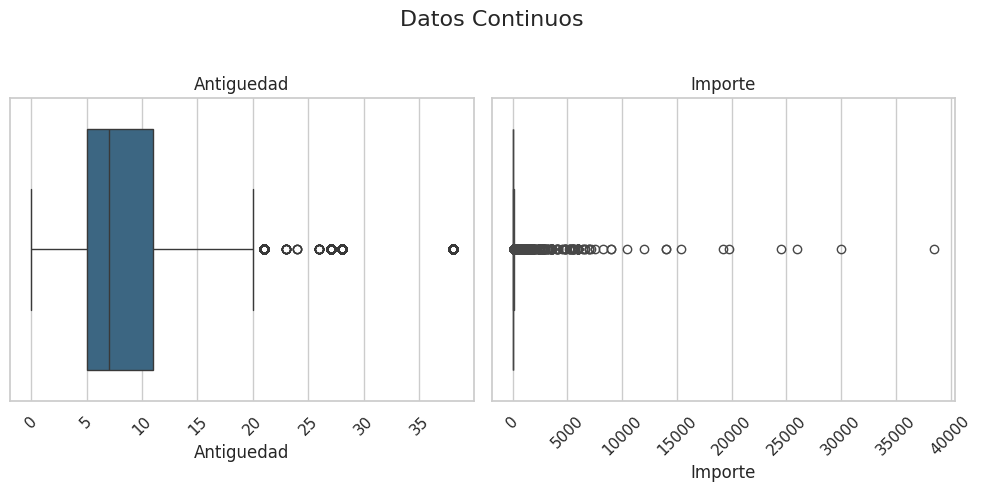

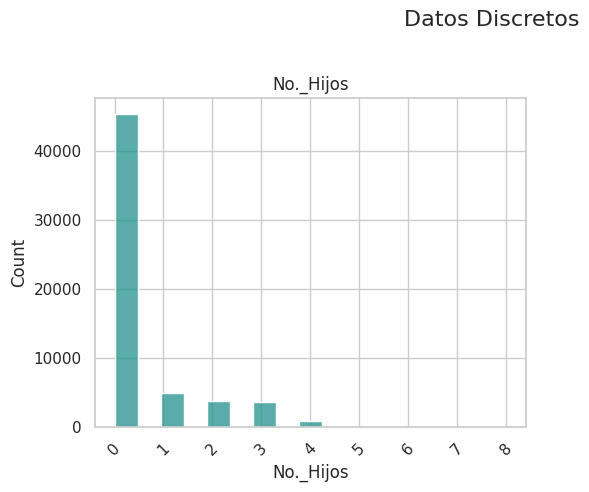

In [20]:
#@title Graficas de los datos continuos o discretos

# Clasificar las columnas en continuos y discretos
cont_cols = [col for col in numericos.columns if len(numericos[col].value_counts()) > 10]
disc_cols = [col for col in numericos.columns if len(numericos[col].value_counts()) <= 10]

# Función para determinar el tamaño de la cuadrícula de subplots
def get_subplot_grid_size(num_plots, max_cols=2):
    num_rows = (num_plots + max_cols - 1) // max_cols
    return num_rows, max_cols

# Configuración del estilo de Seaborn
sns.set(style="whitegrid")

# Colores personalizados para los gráficos
cont_colors = sns.color_palette("viridis", len(cont_cols))
disc_colors = sns.color_palette("viridis", len(disc_cols))

# Graficar datos continuos
num_cont = len(cont_cols)
num_rows, num_cols = get_subplot_grid_size(num_cont)

plt.figure(figsize=(10, num_rows * 5))
plt.suptitle("Datos Continuos", fontsize=16)
for i, col in enumerate(cont_cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(data=numericos, x=col, color=cont_colors[i])
    plt.title(f'{col}')
    plt.xticks(rotation=45)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Graficar datos discretos
num_disc = len(disc_cols)
num_rows, num_cols = get_subplot_grid_size(num_disc)

plt.figure(figsize=(10, num_rows * 5))
plt.suptitle("Datos Discretos", fontsize=16)
for i, col in enumerate(disc_cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(numericos[col], bins='auto', color=disc_colors[i])
    plt.title(f'{col}')
    plt.xticks(rotation=45)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Matrices de correlacion

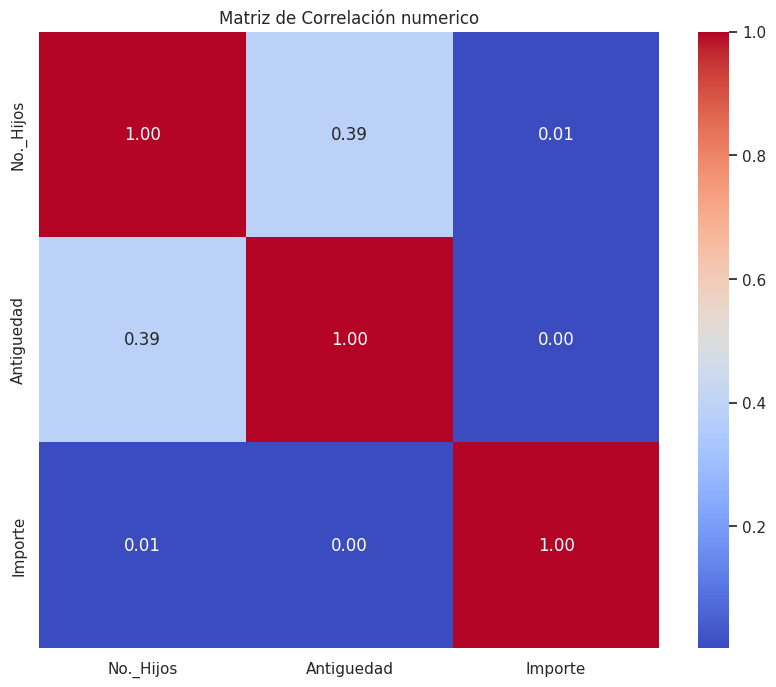

In [21]:
#@title Matriz de correlación numerica
plt.figure(figsize=(10, 8))
sns.heatmap(numericos.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlación numerico')
plt.show()

## Normalizacion y union de los datos

In [22]:
#@title Encoders

label_encoders = {}
categoricos_encoding = categoricos.copy()

for col in categoricos.columns:
    le = LabelEncoder()
    categoricos_encoding[col] = le.fit_transform(categoricos[col])
    label_encoders[col] = le  # Guardar el LabelEncoder para poder invertir más tarde

X_df = pd.concat([numericos, categoricos_encoding], axis=1)

# Normalizar el conjunto combinado
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X_df), columns=X_df.columns)

# Para invertir la codificación
def invertir_label_encoding(df, label_encoders):
    for col, le in label_encoders.items():
      if col in df.columns:
        df[col] = le.inverse_transform(df[col].astype(int))
    return df

X.head()

,No._Hijos,Antiguedad,Importe,Edad_Rango,Escolaridad,Estado_Civil,Estado,Sexo,Grupo,Linea,Fecha
0,0.0,0.394737,0.001127,0.0,0.857143,0.666667,0.6,0.0,0.666667,0.440678,0.0
1,0.0,0.394737,0.001075,0.0,0.857143,0.666667,0.6,0.0,0.666667,0.881356,0.0
2,0.0,0.394737,0.000725,0.0,0.857143,0.666667,0.6,0.0,0.666667,0.864407,0.0
3,0.0,0.394737,0.000816,0.0,0.857143,0.666667,0.6,0.0,0.666667,0.440678,0.0
4,0.0,0.394737,0.000740,0.0,0.857143,0.666667,0.6,0.0,0.666667,0.440678,0.0


## Aplicacion del Kmeans con codo

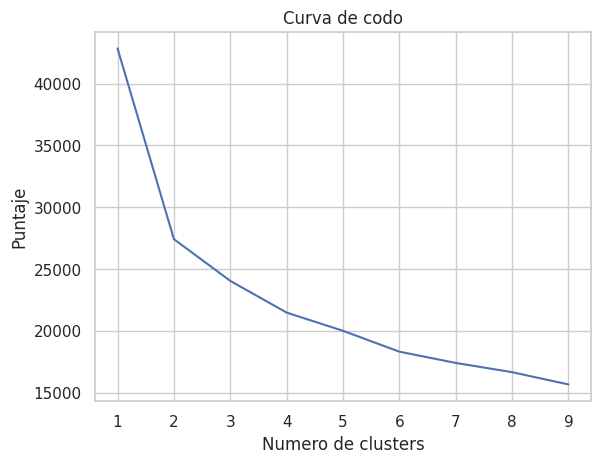

In [23]:
#@title Aplicacion de KMeans y aplicacion del codo

nC = range(1, 10)
kmeans = [KMeans(n_clusters=i, n_init='auto', random_state=42) for i in nC]
score = [-1*kmeans[i].fit(X).score(X) for i in range(len(kmeans))]

plt.plot(nC, score)
plt.xlabel('Numero de clusters')
plt.ylabel('Puntaje')
plt.title('Curva de codo')
plt.show()

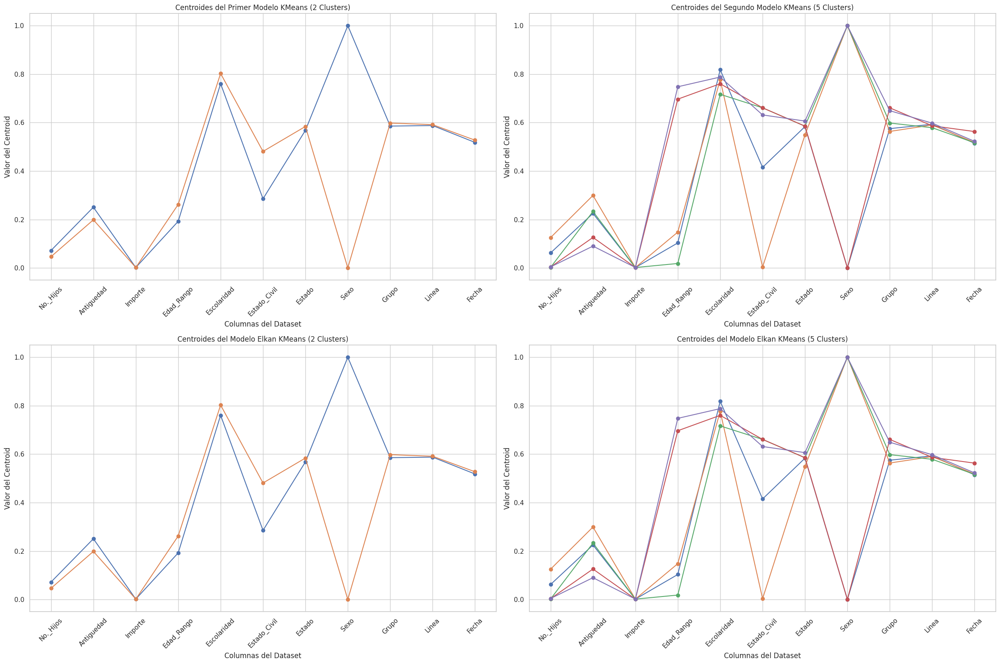

In [24]:
#@title El numero de clusters que se considero fue 2

# Configuración y ajuste del primer modelo KMeans
kmeans1 = KMeans(n_clusters=2, n_init='auto', random_state=42).fit(X)
centroids1 = kmeans1.cluster_centers_

# Configuración y ajuste del segundo modelo KMeans con 40 clusters
kmeans2 = KMeans(n_clusters=5, n_init='auto', random_state=42).fit(X)
centroids2 = kmeans2.cluster_centers_

# Configuración y ajuste del modelo KMeans con el método Elkan para 10 clusters
kmeans_elkan1 = KMeans(n_clusters=2, n_init='auto', random_state=42, algorithm='elkan').fit(X)
centroids_elkan1 = kmeans_elkan1.cluster_centers_

# Configuración y ajuste del modelo KMeans con el método Elkan para 40 clusters
kmeans_elkan2 = KMeans(n_clusters=5, n_init='auto', random_state=42, algorithm='elkan').fit(X)
centroids_elkan2 = kmeans_elkan2.cluster_centers_

# Crear un gráfico con subplots
fig, axs = plt.subplots(2, 2, figsize=(24, 16))

# Graficar los centroides para el primer modelo
for i in range(centroids1.shape[0]):
    axs[0, 0].plot(X.columns, centroids1[i, :], marker='o', label=f'Cluster {i}')
axs[0, 0].set_xlabel('Columnas del Dataset')
axs[0, 0].set_ylabel('Valor del Centroid')
axs[0, 0].set_title('Centroides del Primer Modelo KMeans (2 Clusters)')
axs[0, 0].grid(True)
axs[0, 0].tick_params(axis='x', rotation=45)

# Graficar los centroides para el segundo modelo
for i in range(centroids2.shape[0]):
    axs[0, 1].plot(X.columns, centroids2[i, :], marker='o', label=f'Cluster {i}')
axs[0, 1].set_xlabel('Columnas del Dataset')
axs[0, 1].set_ylabel('Valor del Centroid')
axs[0, 1].set_title('Centroides del Segundo Modelo KMeans (5 Clusters)')
axs[0, 1].grid(True)
axs[0, 1].tick_params(axis='x', rotation=45)

# Graficar los centroides para el modelo KMeans con Elkan (10 clusters)
for i in range(centroids_elkan1.shape[0]):
    axs[1, 0].plot(X.columns, centroids_elkan1[i, :], marker='o', label=f'Cluster {i}')
axs[1, 0].set_xlabel('Columnas del Dataset')
axs[1, 0].set_ylabel('Valor del Centroid')
axs[1, 0].set_title('Centroides del Modelo Elkan KMeans (2 Clusters)')
axs[1, 0].grid(True)
axs[1, 0].tick_params(axis='x', rotation=45)

# Graficar los centroides para el modelo KMeans con Elkan (40 clusters)
for i in range(centroids_elkan2.shape[0]):
    axs[1, 1].plot(X.columns, centroids_elkan2[i, :], marker='o', label=f'Cluster {i}')
axs[1, 1].set_xlabel('Columnas del Dataset')
axs[1, 1].set_ylabel('Valor del Centroid')
axs[1, 1].set_title('Centroides del Modelo Elkan KMeans (5 Clusters)')
axs[1, 1].grid(True)
axs[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### Graficas de cluster 2

In [60]:
#@title Grafico 3D de importe, la linea y la edad con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans1.predict(X)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Edad_Rango']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Edad_Rango']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Edad Rango',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gasto en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [67]:
#@title Grafico 3D de importe, la linea y el sexo con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans1.predict(X)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Sexo']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Sexo']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Sexo',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gasto en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [63]:
#@title Grafico 3D de importe, la linea y el estado civil con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans1.predict(X)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Estado_Civil']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Estado_Civil']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Edad Rango',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gasto en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

### Graficas de cluster 5

In [73]:
#@title Grafico 3D de importe, la linea y la edad con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans2.predict(X)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Edad_Rango']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Edad_Rango']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Edad Rango',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gastos en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [77]:
#@title Grafico 3D de importe, la linea y el sexo con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans2.predict(X)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Sexo']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Sexo']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Sexo',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gasto en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [76]:
#@title Grafico 3D de importe, la linea y el estado civil con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X), columns=X_df.columns)

# Aplicar KMeans para crear clusters
frecuencias["Cluster"] = kmeans2.predict(frecuencias)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Estado_Civil']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Estado_Civil']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=frecuencias['Cluster'],  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Estado Civil',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Ventas en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

## Aplicacion de DBSCAN con Silhouette

Mejor valor de eps: 0.7333333333333333
Mejor valor de min_samples: 5
Mejor índice de Silhouette: 0.3408081022324658
Número de clústeres encontrados: 2


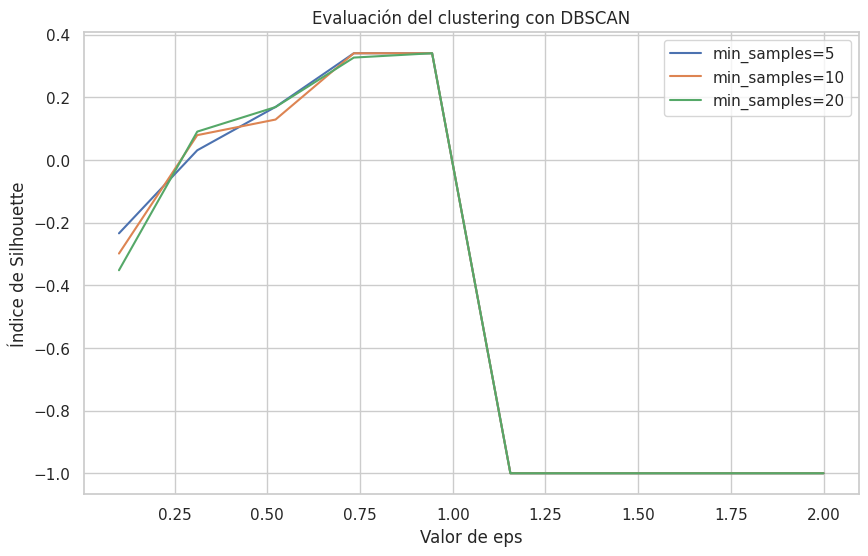

In [79]:
#@title Aplicacion de DBSCAN

# Seleccionar un 10% de los registros de X
np.random.seed(42)  # Para reproducibilidad
sample_indices = np.random.choice(X.index, size=int(0.1 * len(X)), replace=False)
X_sample = X.loc[sample_indices]

# Convertir el DataFrame a un array numpy
X_sample_array = X_sample.values

# Parámetros de DBSCAN a evaluar
eps_values = np.linspace(0.1, 2.0, 10)  # Menos valores para acelerar
min_samples = [5, 10, 20]

def evaluate_dbscan(min_sample, eps):
    dbscan = DBSCAN(eps=eps, min_samples=min_sample)
    labels = dbscan.fit_predict(X_sample_array)

    # Contar el número de clusters (excluyendo el ruido, -1)
    num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

    if num_clusters > 1:
        score = silhouette_score(X_sample_array, labels)
    else:
        score = -1  # Asignar un puntaje bajo si no hay clustering

    return score, num_clusters

results = []
for min_sample in min_samples:
    silhouette_scores = []
    num_clusters_list = []
    for eps in eps_values:
        score, num_clusters = evaluate_dbscan(min_sample, eps)
        silhouette_scores.append(score)
        num_clusters_list.append(num_clusters)
    results.append((silhouette_scores, num_clusters_list))

# Encontrar los mejores parámetros
best_silhouette_score = -1
best_eps = None
best_min_samples = None

for min_sample, (silhouette_scores, num_clusters_list) in zip(min_samples, results):
    best_eps_idx = np.argmax(silhouette_scores)
    if silhouette_scores[best_eps_idx] > best_silhouette_score:
        best_silhouette_score = silhouette_scores[best_eps_idx]
        best_eps = eps_values[best_eps_idx]
        best_min_samples = min_sample

# Imprimir los mejores parámetros encontrados
print(f"Mejor valor de eps: {best_eps}")
print(f"Mejor valor de min_samples: {best_min_samples}")
print(f"Mejor índice de Silhouette: {best_silhouette_score}")

# Obtener el número de clústeres con los mejores parámetros
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(X_sample_array)
best_num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)

# Imprimir el número de clústeres encontrados con los mejores parámetros
print(f"Número de clústeres encontrados: {best_num_clusters}")

# Graficar los resultados
plt.figure(figsize=(10, 6))
for min_sample, (silhouette_scores, _) in zip(min_samples, results):
    plt.plot(eps_values, silhouette_scores, label=f'min_samples={min_sample}')

plt.xlabel('Valor de eps')
plt.ylabel('Índice de Silhouette')
plt.title('Evaluación del clustering con DBSCAN')
plt.legend()
plt.show()

### Graficas de cluster 2

In [80]:
#@title Grafico 3D de importe, la linea y la edad con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X_sample_array), columns=X_df.columns)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Edad_Rango']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Edad_Rango']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=best_labels,  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Edad Rango',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gastos en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [87]:
#@title Grafico 3D de importe, la linea y el sexo con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X_sample_array), columns=X_df.columns)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Sexo']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Sexo']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=best_labels,  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Sexo',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gastos en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()

In [88]:
#@title Grafico 3D de importe, la linea y el estado civil con clusters

# Contar la frecuencia de combinaciones
frecuencias = pd.DataFrame(scaler.inverse_transform(X_sample), columns=X_df.columns)

# Invertir el LabelEncoder para obtener los nombres originales
frecuencias_original = invertir_label_encoding(frecuencias.filter(items=['Linea', 'Estado_Civil']), label_encoders)

# Preparar los datos para el gráfico
x = frecuencias_original['Linea']
y = frecuencias_original['Estado_Civil']
z = frecuencias['Importe']

# Crear el gráfico 3D
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',  # Eliminar etiquetas de texto
    marker=dict(
        size=10,
        color=best_labels,  # Colorear por el cluster
        colorscale='Viridis',
        colorbar=dict(title='Clusters')
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Linea',
        yaxis_title='Estado Civil',
        zaxis_title='Importe',
        xaxis=dict(tickvals=x.unique(), ticktext=x.unique()),
        yaxis=dict(tickvals=y.unique(), ticktext=y.unique()),
        zaxis=dict(tickvals=z.unique(), ticktext=[str(int(val)) for val in z.unique()])  # Convertir valores a strings
    ),
    title='Distribución de Gastos en 3D',
    title_x=0.5,
    title_font=dict(size=20),
    margin=dict(l=0, r=0, b=0, t=40)  # Ajusta los márgenes para una mejor presentación
)

fig.show()